# 主に基礎解析を扱った部分です

In [1]:
import os
import sys
import glob

import numpy as np
import pandas as pd
import seaborn as sns

from tqdm import tqdm

import torch
from torch import nn
from torch.nn import functional as F
from torch.utils.data import Dataset, DataLoader
from torch.cuda.amp import autocast, GradScaler



import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.model_selection import train_test_split

pd.options.display.float_format = '{:.3f}'.format

In [2]:
#データセットをインポート
from sklearn.datasets import fetch_covtype
data = fetch_covtype()

In [3]:
df_data = pd.DataFrame(data.data, columns=data.feature_names)
df_target = pd.DataFrame(data.target)
df_target -= 1 #n値分類の場合は0~n-1のインデックスじゃないとエラーするので1引く

df_all = pd.concat([df_data, df_target],axis=1).rename(columns={0:'Cover_Type'})

df_all.describe()
#df_all

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,...,Soil_Type_31,Soil_Type_32,Soil_Type_33,Soil_Type_34,Soil_Type_35,Soil_Type_36,Soil_Type_37,Soil_Type_38,Soil_Type_39,Cover_Type
count,581012.000,581012.000,581012.000,581012.000,581012.000,581012.000,581012.000,581012.000,581012.000,581012.000,...,581012.000,581012.000,581012.000,581012.000,581012.000,581012.000,581012.000,581012.000,581012.000,581012.000
mean,2959.365,155.657,14.104,269.428,46.419,2350.147,212.146,223.319,142.528,1980.291,...,0.090,0.078,0.003,0.003,0.000,0.001,0.027,0.024,0.015,1.051
std,279.985,111.914,7.488,212.549,58.295,1559.255,26.770,19.769,38.275,1324.195,...,0.287,0.268,0.053,0.057,0.014,0.023,0.162,0.152,0.122,1.397
min,1859.000,0.000,0.000,0.000,-173.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
25%,2809.000,58.000,9.000,108.000,7.000,1106.000,198.000,213.000,119.000,1024.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
50%,2996.000,127.000,13.000,218.000,30.000,1997.000,218.000,226.000,143.000,1710.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000
75%,3163.000,260.000,18.000,384.000,69.000,3328.000,231.000,237.000,168.000,2550.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000
max,3858.000,360.000,66.000,1397.000,601.000,7117.000,254.000,254.000,254.000,7173.000,...,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,6.000


In [4]:
# タイプごとの総数
print(df_all['Cover_Type'].value_counts(dropna=False))

Cover_Type
1    283301
0    211840
2     35754
6     20510
5     17367
4      9493
3      2747
Name: count, dtype: int64


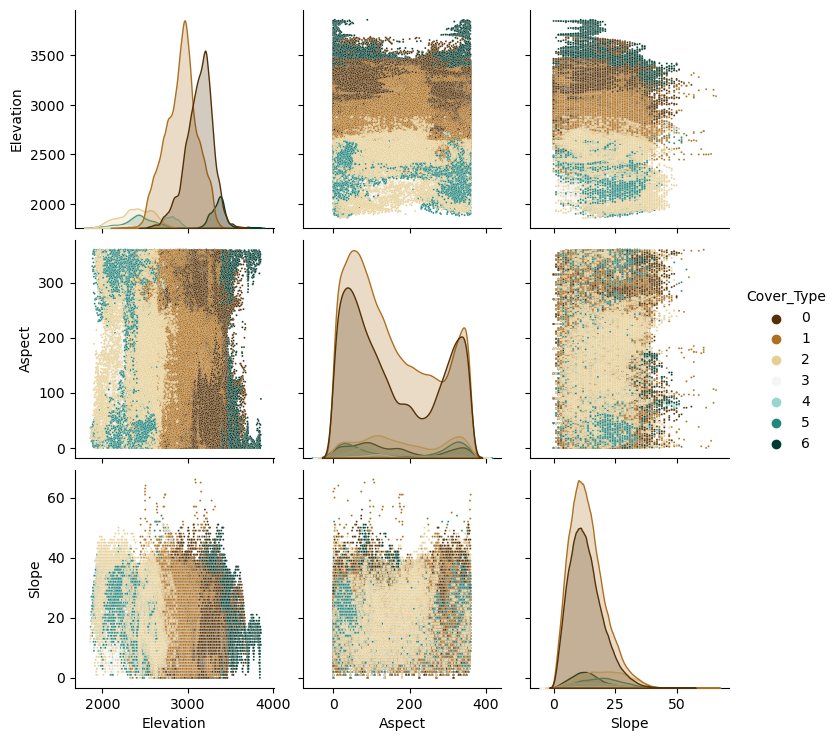

In [5]:
#散布図行列
g = sns.pairplot(df_all[['Elevation','Aspect','Slope','Cover_Type']], hue = 'Cover_Type', diag_kind='kde', palette='BrBG', plot_kws={"s": 2})
plt.show()

In [6]:
df_all.columns

Index(['Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology',
       'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways',
       'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm',
       'Horizontal_Distance_To_Fire_Points', 'Wilderness_Area_0',
       'Wilderness_Area_1', 'Wilderness_Area_2', 'Wilderness_Area_3',
       'Soil_Type_0', 'Soil_Type_1', 'Soil_Type_2', 'Soil_Type_3',
       'Soil_Type_4', 'Soil_Type_5', 'Soil_Type_6', 'Soil_Type_7',
       'Soil_Type_8', 'Soil_Type_9', 'Soil_Type_10', 'Soil_Type_11',
       'Soil_Type_12', 'Soil_Type_13', 'Soil_Type_14', 'Soil_Type_15',
       'Soil_Type_16', 'Soil_Type_17', 'Soil_Type_18', 'Soil_Type_19',
       'Soil_Type_20', 'Soil_Type_21', 'Soil_Type_22', 'Soil_Type_23',
       'Soil_Type_24', 'Soil_Type_25', 'Soil_Type_26', 'Soil_Type_27',
       'Soil_Type_28', 'Soil_Type_29', 'Soil_Type_30', 'Soil_Type_31',
       'Soil_Type_32', 'Soil_Type_33', 'Soil_Type_34', 'Soil_Type_35',
       'Soil_Type_36', 'S

In [7]:
# 各カバレッジから1000ずつサンプリング
df_cov0_sample = df_all[df_all['Cover_Type'] == 0].sample(n=1000)
df_cov1_sample = df_all[df_all['Cover_Type'] == 1].sample(n=1000)
df_cov2_sample = df_all[df_all['Cover_Type'] == 2].sample(n=1000)
df_cov3_sample = df_all[df_all['Cover_Type'] == 3].sample(n=1000)
df_cov4_sample = df_all[df_all['Cover_Type'] == 4].sample(n=1000)
df_cov5_sample = df_all[df_all['Cover_Type'] == 5].sample(n=1000)
df_cov6_sample = df_all[df_all['Cover_Type'] == 6].sample(n=1000)

df_sample = pd.concat([df_cov0_sample, df_cov1_sample, df_cov2_sample, df_cov3_sample, df_cov4_sample, df_cov5_sample, df_cov6_sample])
df_sample

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,...,Soil_Type_31,Soil_Type_32,Soil_Type_33,Soil_Type_34,Soil_Type_35,Soil_Type_36,Soil_Type_37,Soil_Type_38,Soil_Type_39,Cover_Type
563648,2724.000,35.000,19.000,510.000,-62.000,3090.000,214.000,195.000,109.000,2589.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0
321438,3413.000,281.000,30.000,175.000,0.000,3153.000,125.000,227.000,234.000,1930.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0
53273,3182.000,35.000,8.000,0.000,0.000,4257.000,219.000,223.000,139.000,3275.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0
462336,2954.000,206.000,9.000,60.000,-3.000,420.000,215.000,249.000,169.000,979.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0
538324,3040.000,90.000,22.000,180.000,48.000,3242.000,247.000,200.000,71.000,805.000,...,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
353382,3324.000,103.000,11.000,247.000,27.000,2659.000,238.000,226.000,118.000,1589.000,...,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,6
211567,3299.000,154.000,10.000,371.000,75.000,3249.000,232.000,241.000,139.000,2054.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,6
283828,3211.000,35.000,22.000,666.000,4.000,874.000,212.000,186.000,101.000,1932.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,6
465593,3361.000,225.000,12.000,67.000,2.000,4440.000,204.000,251.000,183.000,3524.000,...,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,6


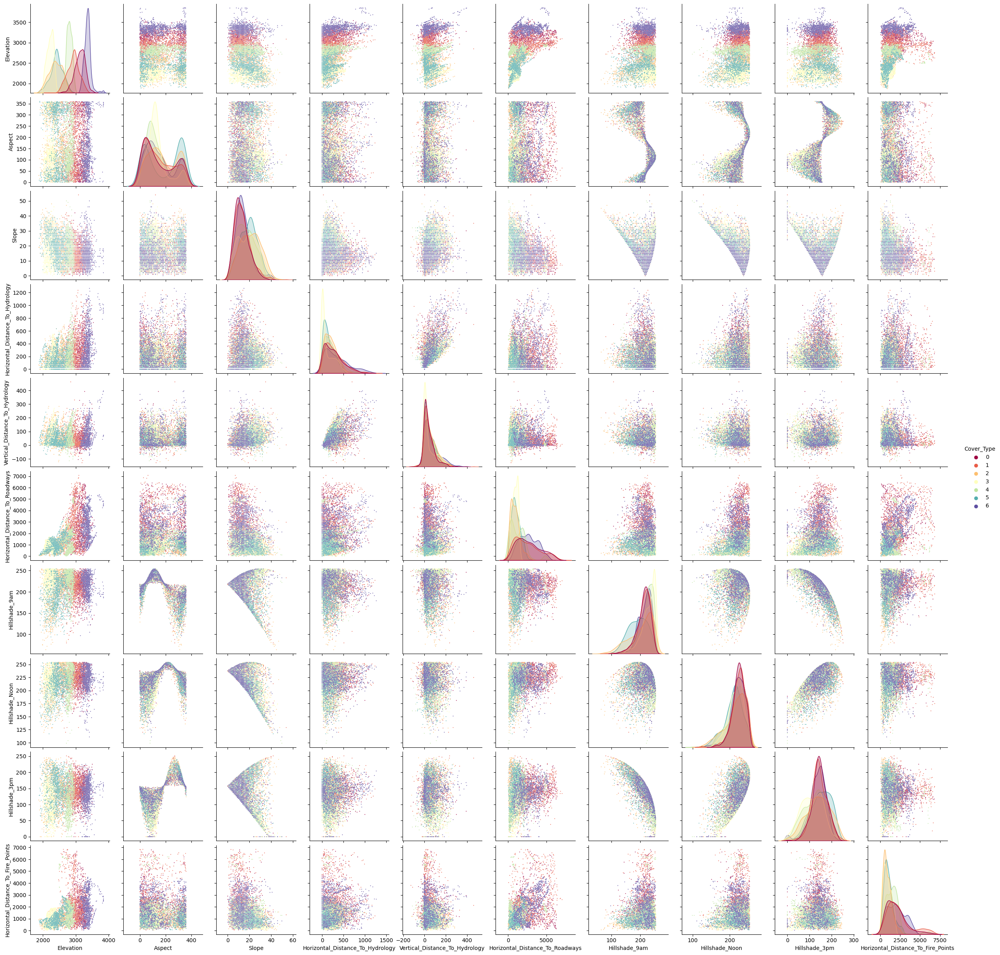

In [ ]:
plot_columns = ['Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology',
       'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways',
       'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm',
       'Horizontal_Distance_To_Fire_Points', 'Cover_Type']

g = sns.pairplot(df_sample[plot_columns], hue = 'Cover_Type', diag_kind='kde', palette='Spectral', plot_kws={"s": 2})
plt.show()

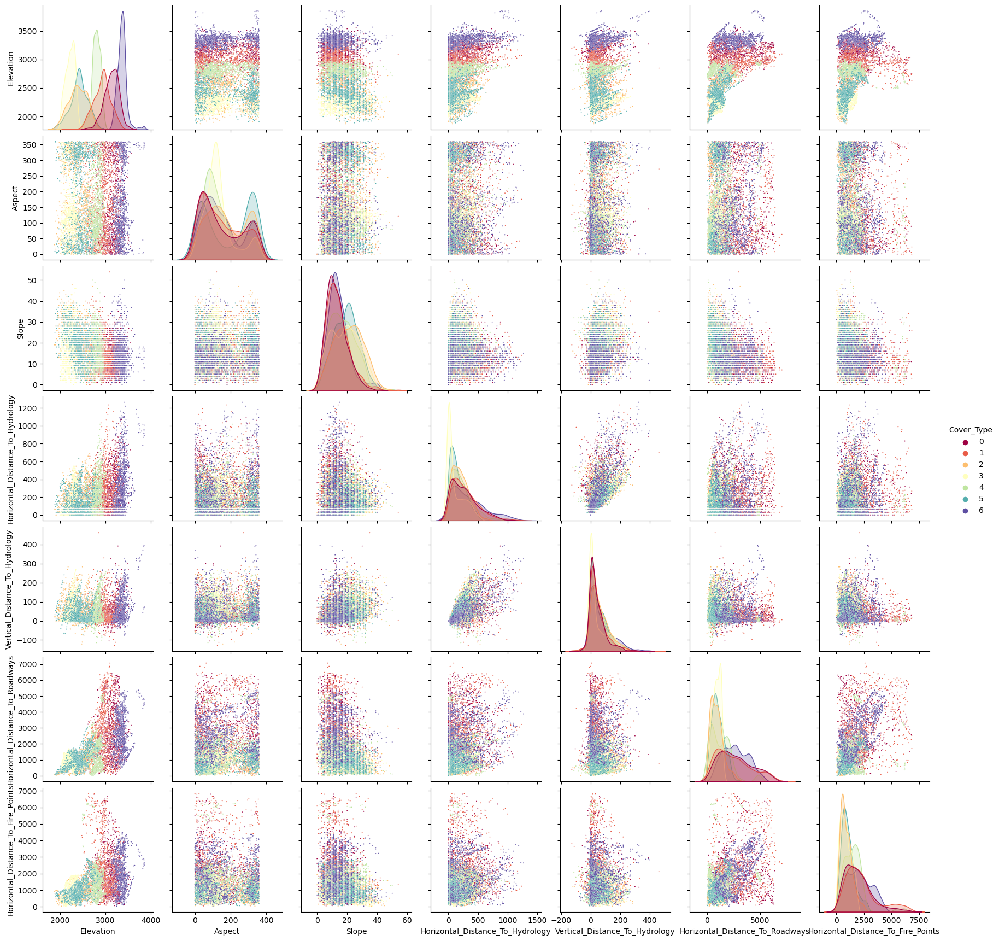

In [64]:
plot_columns_p = ['Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology',
       'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways',
       'Horizontal_Distance_To_Fire_Points', 'Cover_Type']

g = sns.pairplot(df_sample[plot_columns_p], hue = 'Cover_Type', diag_kind='kde', palette='Spectral', plot_kws={"s": 2})
plt.show()

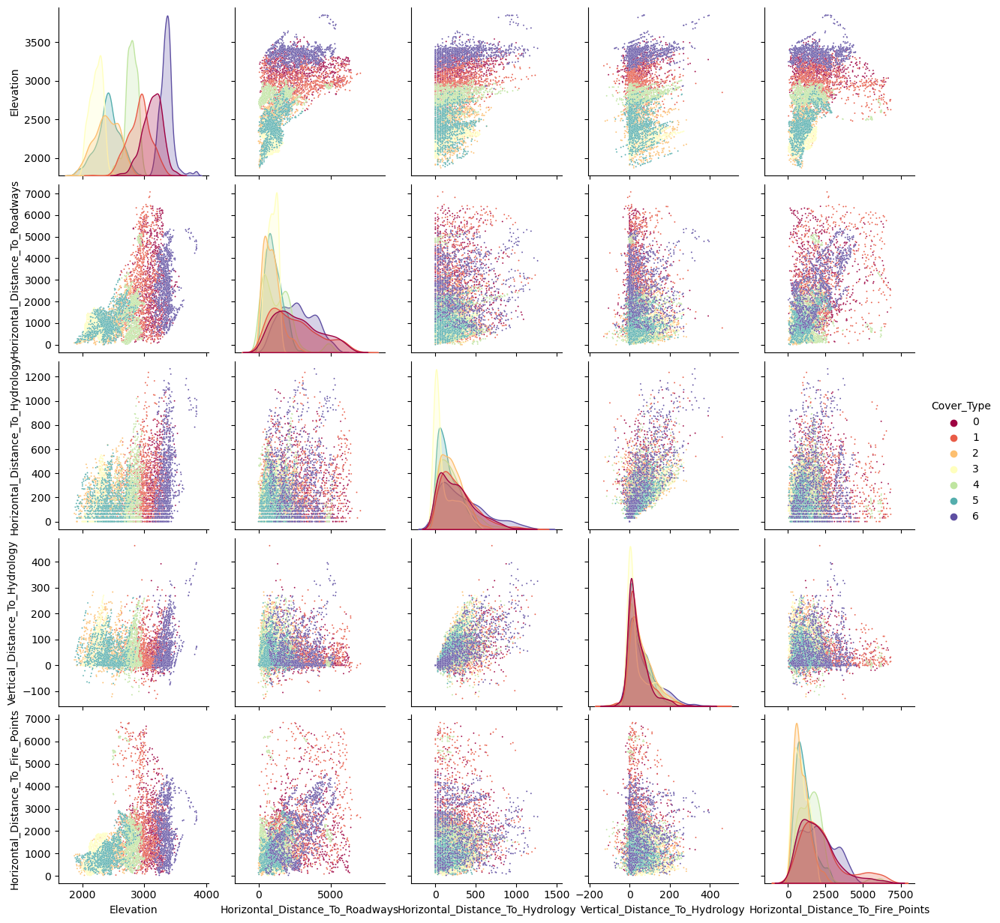

In [67]:
plot_columns_p2 = ['Elevation','Horizontal_Distance_To_Roadways', 'Horizontal_Distance_To_Hydrology',
       'Vertical_Distance_To_Hydrology',
       'Horizontal_Distance_To_Fire_Points', 'Cover_Type']

g = sns.pairplot(df_sample[plot_columns_p2], hue = 'Cover_Type', diag_kind='kde', palette='Spectral', plot_kws={"s": 2})
plt.show()

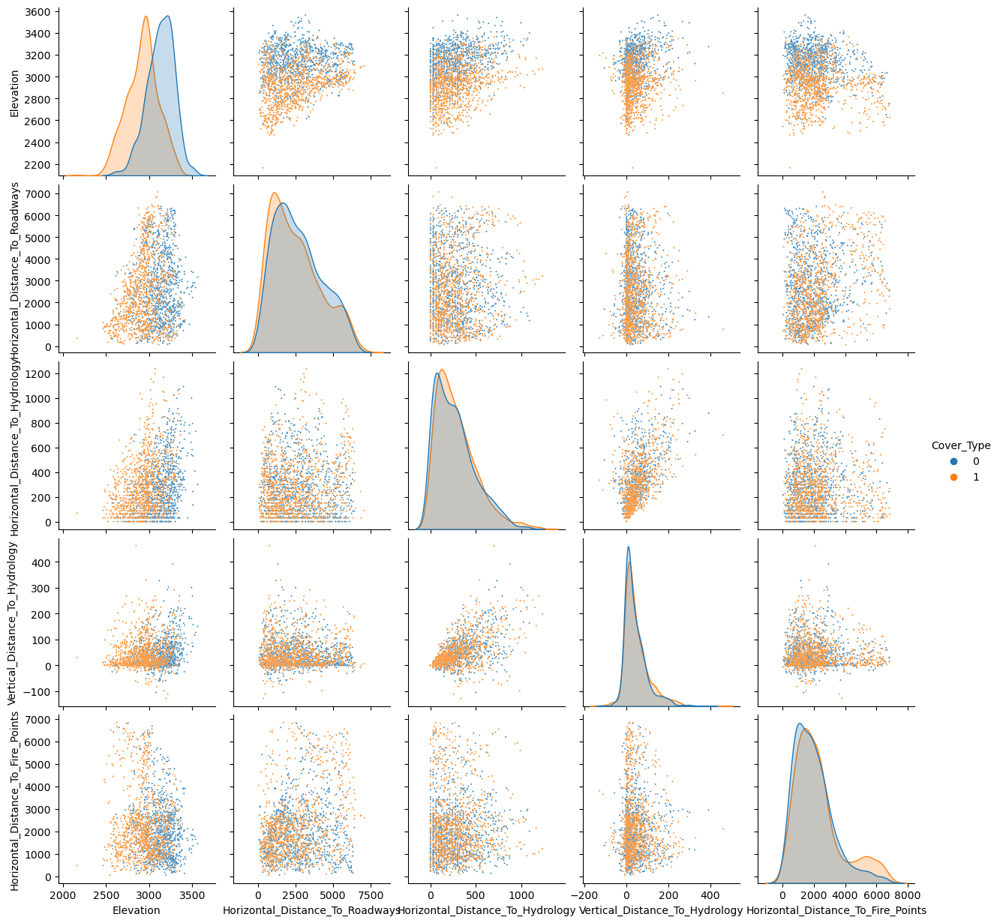

In [72]:
df_cov01 = pd.concat([df_cov0_sample, df_cov1_sample])
g = sns.pairplot(df_cov01[plot_columns_p2], hue = 'Cover_Type', diag_kind='kde',  plot_kws={"s": 2})
plt.show()

In [70]:
corr_matrix

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,...,Soil_Type_31,Soil_Type_32,Soil_Type_33,Soil_Type_34,Soil_Type_35,Soil_Type_36,Soil_Type_37,Soil_Type_38,Soil_Type_39,Cover_Type
Elevation,1.000,0.016,-0.243,0.306,0.093,0.366,0.112,0.206,0.059,0.148,...,0.167,0.071,0.012,0.083,0.021,0.035,0.217,0.194,0.213,-0.270
Aspect,0.016,1.000,0.079,0.017,0.070,0.025,-0.579,0.336,0.647,-0.109,...,0.056,0.019,0.011,-0.022,0.002,-0.020,0.018,0.008,-0.006,0.017
Slope,-0.243,0.079,1.000,-0.011,0.275,-0.216,-0.327,-0.527,-0.176,-0.186,...,-0.134,0.209,-0.011,-0.022,0.003,0.008,-0.072,0.094,0.026,0.148
Horizontal_Distance_To_Hydrology,0.306,0.017,-0.011,1.000,0.606,0.072,-0.027,0.047,0.052,0.052,...,0.127,0.101,0.070,-0.005,0.033,-0.007,0.043,0.032,0.147,-0.020
Vertical_Distance_To_Hydrology,0.093,0.070,0.275,0.606,1.000,-0.046,-0.166,-0.111,0.035,-0.070,...,0.040,0.167,0.060,-0.006,0.013,-0.008,-0.009,0.044,0.179,0.082
Horizontal_Distance_To_Roadways,0.366,0.025,-0.216,0.072,-0.046,1.000,0.034,0.189,0.106,0.332,...,-0.089,-0.083,0.006,-0.003,0.008,0.016,0.080,0.034,0.016,-0.153
Hillshade_9am,0.112,-0.579,-0.327,-0.027,-0.166,0.034,1.000,0.010,-0.780,0.133,...,0.006,-0.064,0.007,0.028,0.008,0.010,0.015,-0.030,-0.000,-0.035
Hillshade_Noon,0.206,0.336,-0.527,0.047,-0.111,0.189,0.010,1.000,0.594,0.057,...,0.125,-0.086,0.043,0.006,0.016,-0.023,0.043,-0.072,-0.040,-0.096
Hillshade_3pm,0.059,0.647,-0.176,0.052,0.035,0.106,-0.780,0.594,1.000,-0.048,...,0.083,-0.024,0.018,-0.016,0.001,-0.022,0.022,-0.029,-0.024,-0.048
Horizontal_Distance_To_Fire_Points,0.148,-0.109,-0.186,0.052,-0.070,0.332,0.133,0.057,-0.048,1.000,...,-0.090,-0.059,-0.035,-0.000,-0.011,0.004,-0.020,-0.003,0.009,-0.109


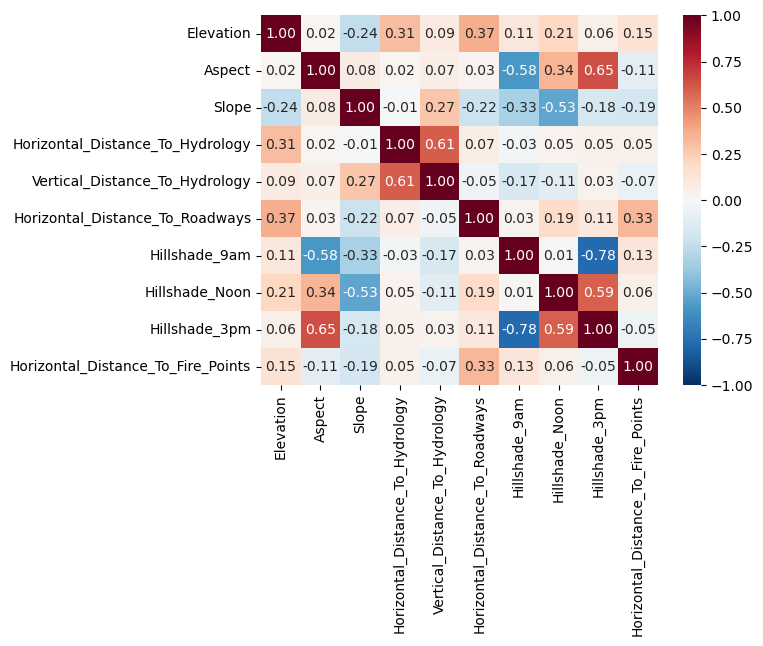

In [11]:
corr_matrix = df_all[plot_columns].corr(method='pearson')
sns.heatmap(corr_matrix,
            vmin=-1.0,
            vmax=1.0,
            center=0,
            annot=True,
            cmap = 'RdBu_r',
            fmt='.2f',
            xticklabels=corr_matrix.columns.values,
            yticklabels=corr_matrix.columns.values
           )
plt.show()

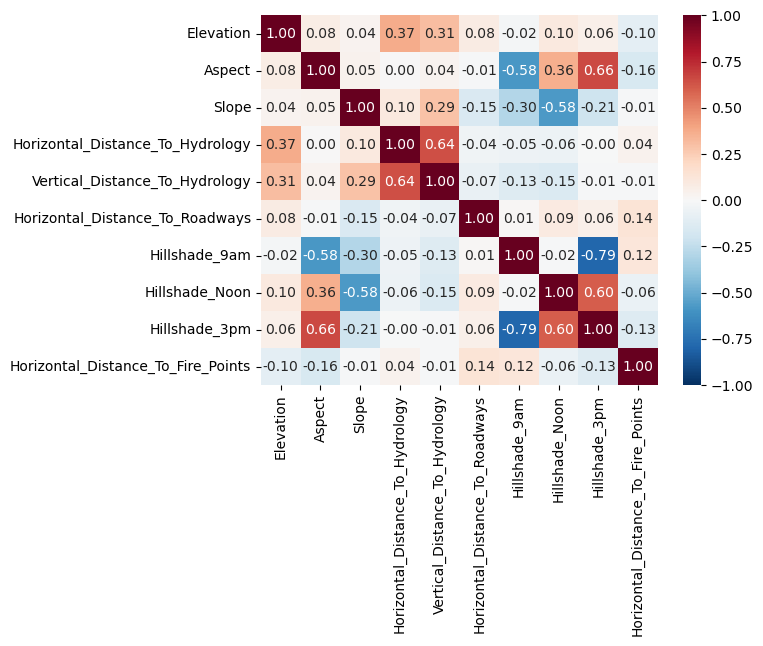

None

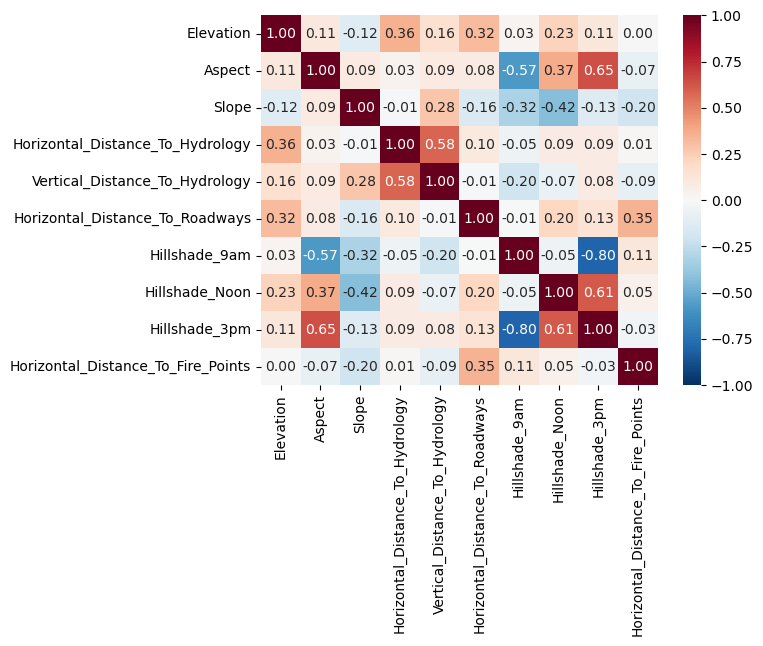

In [13]:
df_0 = df_all[df_all['Cover_Type'] == 0]
corr_matrix = df_0[plot_columns].corr(method='pearson')
sns.heatmap(corr_matrix,
            vmin=-1.0,
            vmax=1.0,
            center=0,
            annot=True,
            cmap = 'RdBu_r',
            fmt='.2f',
            xticklabels=corr_matrix.columns.values,
            yticklabels=corr_matrix.columns.values
           )
display(plt.show())

df_1 = df_all[df_all['Cover_Type'] == 1]
corr_matrix = df_1[plot_columns].corr(method='pearson')
sns.heatmap(corr_matrix,
            vmin=-1.0,
            vmax=1.0,
            center=0,
            annot=True,
            cmap = 'RdBu_r',
            fmt='.2f',
            xticklabels=corr_matrix.columns.values,
            yticklabels=corr_matrix.columns.values
           )
plt.show()

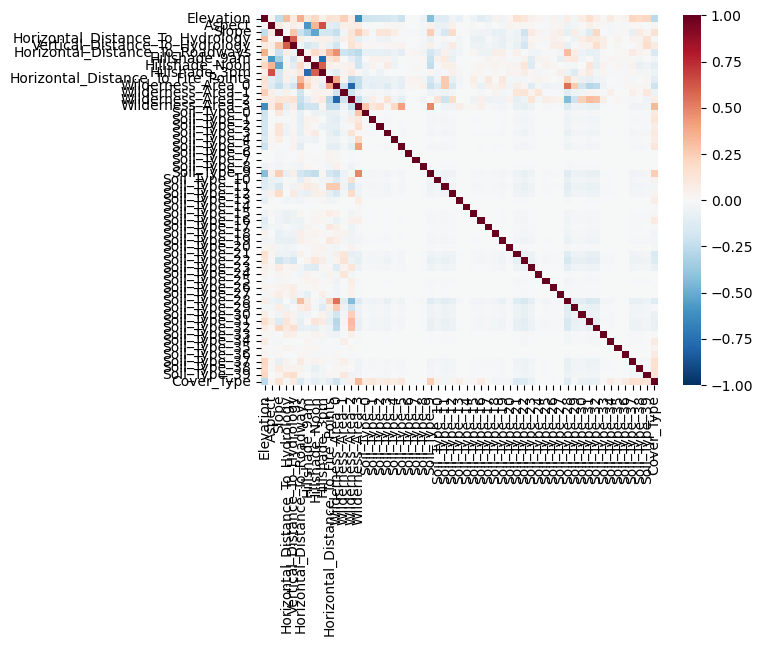

In [63]:
corr_matrix = df_all.corr(method='pearson')
sns.heatmap(corr_matrix,
            vmin=-1.0,
            vmax=1.0,
            center=0,
            #annot=True,
            cmap = 'RdBu_r',
            fmt='.2f',
            xticklabels=corr_matrix.columns.values,
            yticklabels=corr_matrix.columns.values
           )
plt.show()